In [1]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install facenet-pytorch yt-dlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.4/175.4 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 75.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 86.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 85.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.6/755.6 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 60.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 33.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 36.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/

In [2]:
import os
import sys
import shutil
import subprocess
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
from torchvision.io import read_image
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid
from facenet_pytorch import MTCNN, InceptionResnetV1
from IPython.display import Video




In [3]:
print("Platform:", sys.platform)
print("Python version:", sys.version)
print("torch version : ", torch.__version__)
print("torchvision version : ", torchvision.__version__)

print("cv2 version : ", cv2.__version__)
!python --version


Platform: linux
Python version: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
torch version :  2.2.2+cu121
torchvision version :  0.17.2+cu121
cv2 version :  4.12.0
Python 3.11.13


In [11]:
#Fetching YouTube Video Data
from pathlib import Path

# 1. مسار المشروع داخل Google Drive
project_dir = Path("/content/drive/MyDrive/my_project")

# 2. إنشاء مجلدات فرعية
data_dir = project_dir / "data"
video_dir = data_dir / "videos"
images_dir = data_dir / "images"

# 3. إنشاء كل المجلدات
for folder in [data_dir, video_dir, images_dir]:
    folder.mkdir(parents=True, exist_ok=True)

# 4. طباعة المسارات
print(f"📁 Main project directory: {project_dir}")
print(f"📂 Data directory: {data_dir}")
print(f"📽️ Videos will be saved in: {video_dir}")
print(f"🖼️ Images will be saved in: {images_dir}")


📁 Main project directory: /content/drive/MyDrive/my_project
📂 Data directory: /content/drive/MyDrive/my_project/data
📽️ Videos will be saved in: /content/drive/MyDrive/my_project/data/videos
🖼️ Images will be saved in: /content/drive/MyDrive/my_project/data/images


In [6]:
!ls -l /content/drive/MyDrive/my_project/data/videos/


total 153101
-rw------- 1 root root   4399018 Jul 26 18:47  output.mp4
-rw------- 1 root root 152375893 Jul 26 18:35 'yawmiaat wanis.mp4'


In [ ]:
video_url = "https://www.youtube.com/watch?v=5rGNDuRB_GY"
output_path = str(video_dir/ "yawmiaat wanis.mp4")


!yt-dlp -f best -o "{output_path}" {video_url}


         To let yt-dlp download and merge the best available formats, simply do not pass any format selection.
         If you know what you are doing and want only the best pre-merged format, use "-f b" instead to suppress this warning
[youtube] Extracting URL: https://www.youtube.com/watch?v=5rGNDuRB_GY
[youtube] 5rGNDuRB_GY: Downloading webpage
[youtube] 5rGNDuRB_GY: Downloading tv client config
[youtube] 5rGNDuRB_GY: Downloading tv player API JSON
[youtube] 5rGNDuRB_GY: Downloading ios player API JSON
[youtube] 5rGNDuRB_GY: Downloading m3u8 information
[info] 5rGNDuRB_GY: Downloading 1 format(s): 18
[download] Destination: /content/drive/MyDrive/my_project/data/videos/yawmiaat wanis.mp4
[download] 100% of  145.32MiB in 00:00:07 at 18.26MiB/s


In [ ]:
#display the vidue
from IPython.display import Video
Video(output_path, width=500, embed=True)


In [ ]:
#cut_video function
def cut_video(input_file, output_file, start_time, duration):
    """
    Cuts a portion of the video.

    :parameter input_file: Path to the input video file.
    :parameter output_file: Path to the output video file.
    :parameter start_time: Start time of the cut in seconds or in `HH:MM:SS` format.
    :parameter duration: Duration of the cut in seconds or in `HH:MM:SS` format.
    """
    command = [
        "ffmpeg",
        "-ss",
        str(start_time),
        "-i",
        input_file,
        "-t",
        str(duration),
        "-c",
        "copy",
        output_file,
    ]
    subprocess.run(command)


#cut_video?

In [ ]:
!ls -l /content/drive/MyDrive/my_project/data/videos/

total 148805
-rw------- 1 root root 152375893 Jul 26 18:35 'yawmiaat wanis.mp4'


In [ ]:
input_file = "/content/drive/MyDrive/my_project/data/videos/yawmiaat wanis.mp4"
output_file = "/content/drive/MyDrive/my_project/data/videos/output.mp4"

# قص 1 دقيقة من البداية (00:00:00)
cut_video(input_file, output_file, start_time="00:00:00", duration="00:01:00")



In [ ]:
from IPython.display import Video

# مسار الفيديو الذي تم تحميله
output_video = "/content/drive/MyDrive/my_project/data/videos/output.mp4"

# عرض الفيديو داخل الدفتر (embed=True)
Video(output_video, width=500, embed=True)

In [7]:
#Create a video capture for the one minute video
output_video="/content/drive/MyDrive/my_project/data/videos/output.mp4"
video_capture = cv2.VideoCapture(output_video)

if not video_capture.isOpened():
    print("Error: Could not open video.")
else:
    frame_rate = video_capture.get(cv2.CAP_PROP_FPS)
    frame_count = int(video_capture.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Frame rate: {frame_rate}")
    print(f"Total number of frames: {frame_count}")

Frame rate: 25.0
Total number of frames: 1500


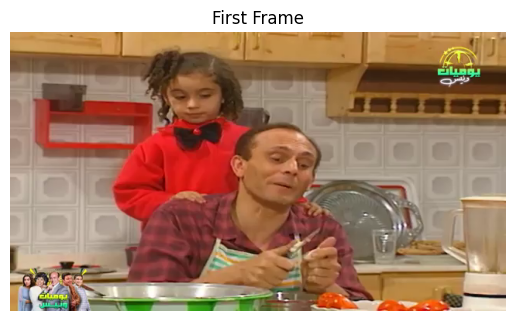

In [8]:
#Use the video capture variable you defined in the previous task and fetch the first frame.
ret, first_frame = video_capture.read()

if ret:
    plt.imshow(cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB))
    plt.title("First Frame")
    plt.axis("off")
    plt.show()
else:
    print("Error: Could not read frame.")

In [9]:
height, width, channel = first_frame.shape

print("frames height : ", height)
print("frames width : ", width)
print("frames channel : ", channel)

frames height :  360
frames width :  640
frames channel :  3


In [12]:
frames_dir = images_dir/"extracted_frames"

frames_dir.mkdir(exist_ok=True)
print(frames_dir)

/content/drive/MyDrive/my_project/data/images/extracted_frames


In [13]:
#saves every fifth frame from the video.
interval = frame_rate * 0.20  # Extract every fifth frame from the video
frame_count = 0

print("Start extracting individual frames...")
while True:
    # read next frame from the video_capture
    ret, frame = video_capture.read()
    if not ret:
        print("Finished!")
        break  # Break the loop if there are no more frames

    # Save frames at every 'interval' frames
    if frame_count % interval == 0:
        frame_path = frames_dir / f"frame_{frame_count}.jpg"
        cv2.imwrite(frame_path, frame)

    frame_count += 1

video_capture.release()

Start extracting individual frames...
Finished!


In [14]:
#Compute the number of frames
frames_dir.iterdir()

<generator object Path.iterdir at 0x7b625264ea40>

In [15]:
def display_sample_images(dir_path, sample=5):
    image_list = []
    images = sorted(dir_path.iterdir())
    if images:
        sample_images = images[:sample]
        for sample_image in sample_images:
            image = read_image(str(sample_image))

            # Define resizing transformation that resizes to 240 x 240
            resize_transform = transforms.Resize((240, 240))
            # Resize image by using `resize_transform`
            image = resize_transform(image)
            image_list.append(image)
    grid = make_grid(image_list, nrow=5)
    image = to_pil_image(grid)
    return image


#display_sample_images?

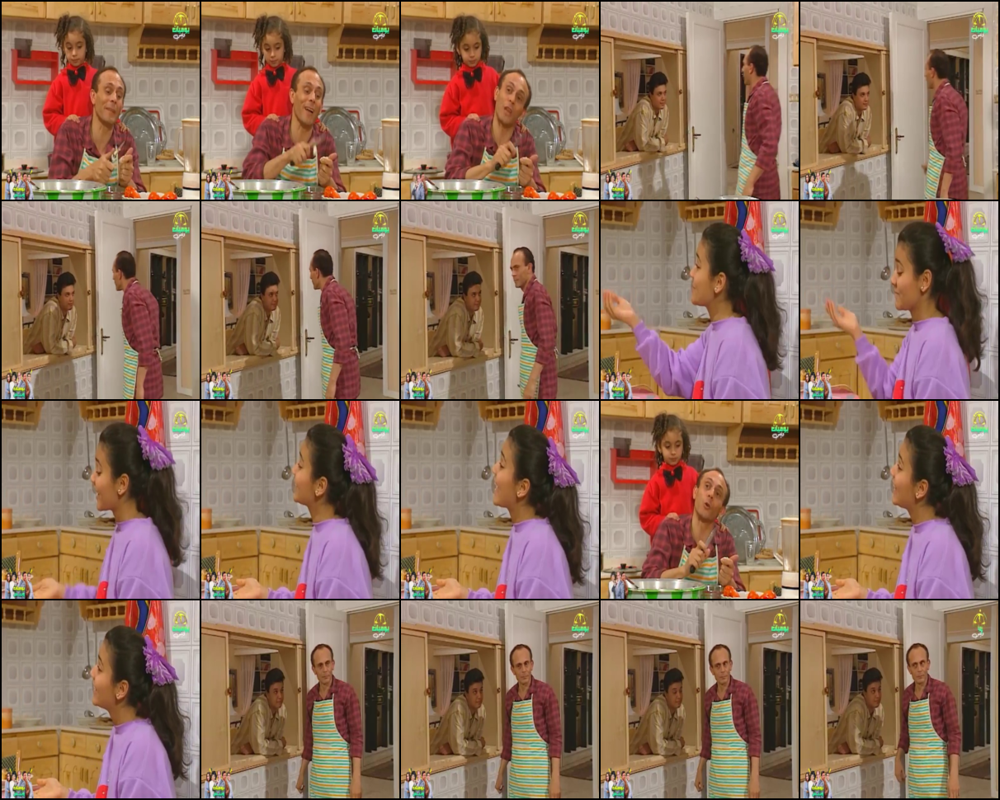

In [16]:
# Call function `display_sample_images` on `frames_dir`
display_sample_images(frames_dir, sample=20)

In [17]:
#Create an absolute path for the extracted_frames
curr_work_dir = Path.cwd()

print("curr_work_dir= ",curr_work_dir)
extracted_frames_dir = curr_work_dir/ "/content/drive/MyDrive/my_project/data/images/extracted_frames"
print(extracted_frames_dir)

curr_work_dir=  /content
/content/drive/MyDrive/my_project/data/images/extracted_frames


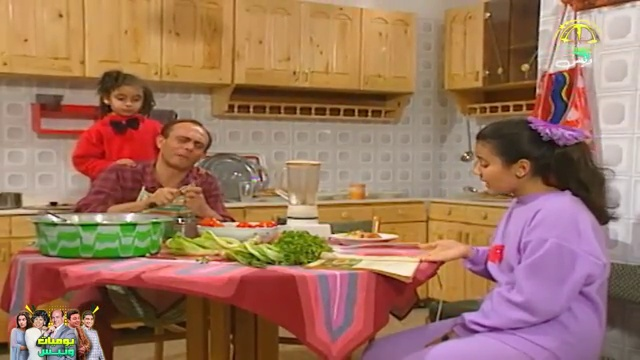

In [18]:
#Create a file path to the sample image
sample_image_filename = "frame_320.jpg"
sample_image_path = extracted_frames_dir/sample_image_filename

sample_image = Image.open(sample_image_path)
sample_image

In [19]:
mtcnn = MTCNN(keep_all=True, min_face_size=60, post_process=False)
boxes, probs = mtcnn.detect(sample_image)

#mtcnn0 = MTCNN(image_size=240, keep_all=False, min_face_size=40)


print("boxes type:", type(boxes))
print("probs type:", type(probs))
print(boxes)
print(boxes.shape)

boxes type: <class 'numpy.ndarray'>
probs type: <class 'numpy.ndarray'>
[[473.73150634765625 137.81263732910156 511.9655456542969
  197.62525939941406]
 [166.2360382080078 124.68181610107422 202.2393035888672
  166.63644409179688]
 [111.31050109863281 84.21898651123047 141.13751220703125
  118.85768127441406]]
(3, 4)


3


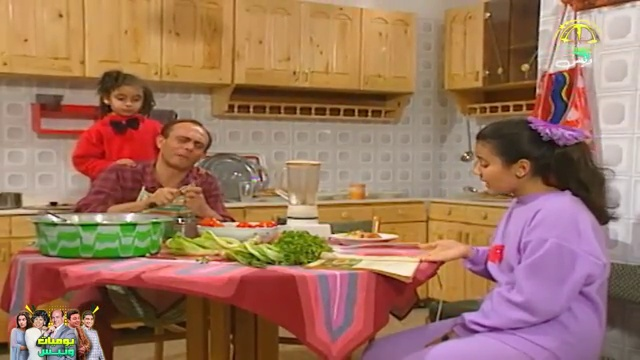

In [20]:
number_of_detected_faces = len(boxes)

print(number_of_detected_faces)
sample_image

In [21]:
probs[probs>0.99]
num_faces = len(probs[probs>0.99])

print(num_faces)

3


boxes type: <class 'numpy.ndarray'>
probs type: <class 'numpy.ndarray'>
landmarks type: <class 'numpy.ndarray'>
(3, 5, 2)


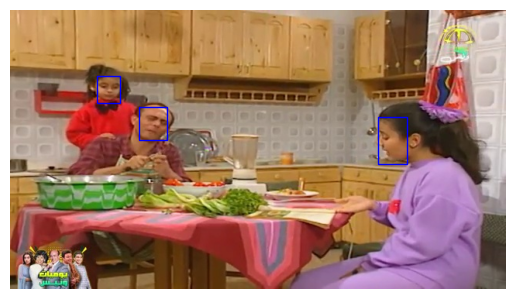

In [22]:
fig, ax = plt.subplots()
ax.imshow(sample_image)

for box in boxes:
    rect = plt.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="blue"
    )
    ax.add_patch(rect)
plt.axis("off");
boxes, probs, landmarks = mtcnn.detect(sample_image,landmarks=True)

print("boxes type:", type(boxes))
print("probs type:", type(probs))
print("landmarks type:", type(landmarks))
print(landmarks.shape)

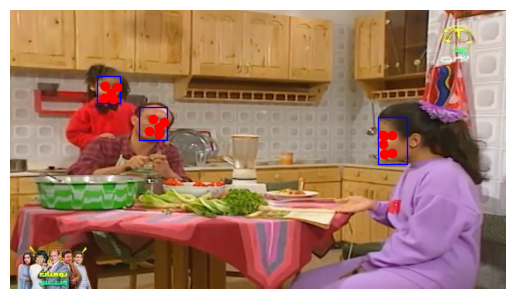

In [23]:
#plot the bounding boxes as well as the facial landmarks on top of the sample image.
fig, ax = plt.subplots()
ax.imshow(sample_image)

for box, landmark in zip(boxes, landmarks):
    rect = plt.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="blue"
    )
    ax.add_patch(rect)
    for point in landmark:
        ax.plot(point[0], point[1], marker="o", color="red")
plt.axis("off");

Cropping out Detected Faces

torch.Size([3, 3, 160, 160])
torch.Size([3, 164, 488])


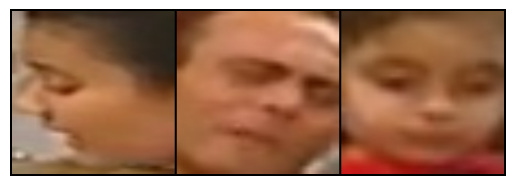

In [24]:
#Use the MTCNN model that we initialized in the first task and pass it the sample_image.
faces = mtcnn(sample_image)

print(faces.shape)
#ceate a grid of these three images by using make_grid from torchvision.
Grid = make_grid(faces)

print(Grid.shape)
plt.imshow(Grid.permute(1, 2, 0).int())
plt.axis("off");

In [25]:
#Prepare a Subset of Images for Next Steps
# Make a directory into which we'll put the selected images
images_dir = curr_work_dir / "/content/drive/MyDrive/my_project/data/images/images_folder"
images_dir.mkdir(exist_ok=True)

wanis_dir = images_dir/ 'wanis'
wanis_dir.mkdir(exist_ok=True)
azz_dir = images_dir/"azz"
azz_dir.mkdir(exist_ok=True)
hoda_dir = images_dir/"Hoda"
hoda_dir.mkdir(exist_ok=True)
sharf_dir = images_dir/"sharf"
sharf_dir.mkdir(exist_ok=True)
gehad_dir = images_dir/"gehad"
gehad_dir.mkdir(exist_ok=True)

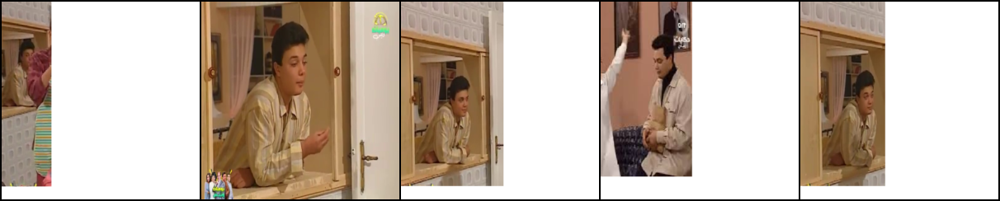

In [27]:
display_sample_images(azz_dir , sample=5)

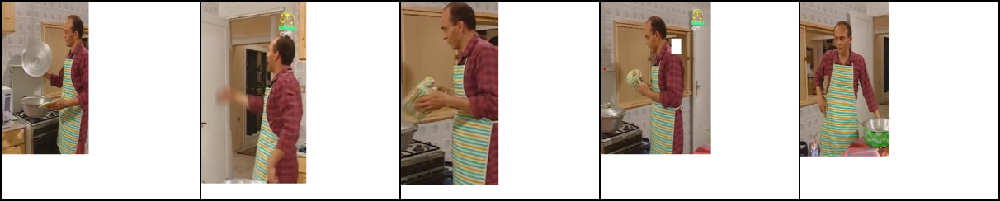

In [28]:
display_sample_images(wanis_dir , sample=5)

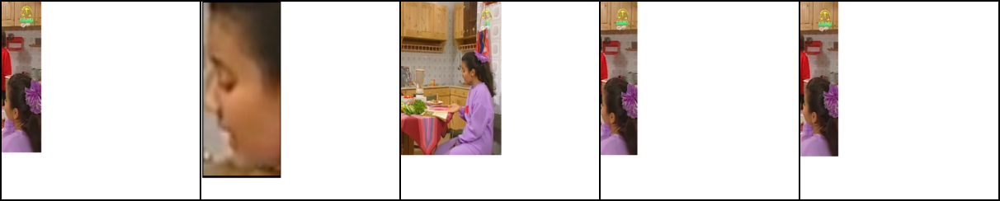

In [31]:
display_sample_images(gehad_dir , sample=5)

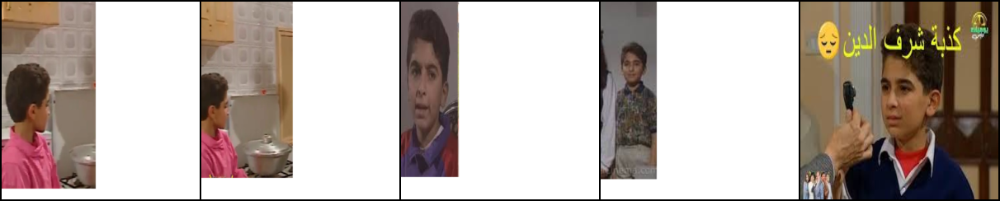

In [30]:
display_sample_images(sharf_dir , sample=5)

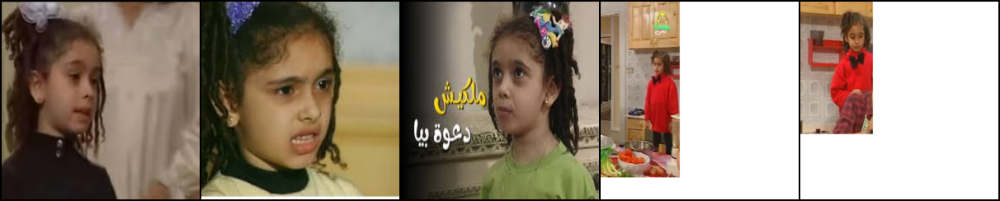

In [29]:
display_sample_images(hoda_dir , sample=5)

In [32]:
mtcnn0 = MTCNN(image_size=240, keep_all=False, min_face_size=30)
resnet = InceptionResnetV1(pretrained="vggface2").eval()

  0%|          | 0.00/107M [00:00<?, ?B/s]

In [33]:
images_folder = Path('/content/drive/MyDrive/my_project/data/images/images_folder')

print(f"Path to images: {images_folder}")

Path to images: /content/drive/MyDrive/my_project/data/images/images_folder


In [34]:
#Create an ImageFolder object for the path object
dataset = datasets.ImageFolder(images_folder)

print(dataset)
#With a ImageFolder object, the .class_to_idx is a mapping between class label to class integer.
dataset.class_to_idx


#Create a dictionary that maps integer to class label.
idx_to_class = {i: c for c, i in dataset.class_to_idx.items()}

print(idx_to_class)

Dataset ImageFolder
    Number of datapoints: 37
    Root location: /content/drive/MyDrive/my_project/data/images/images_folder
{0: 'Hoda', 1: 'azz', 2: 'gehad', 3: 'sharf', 4: 'wanis'}


Dataset ImageFolder
    Number of datapoints: 37
    Root location: /content/drive/MyDrive/my_project/data/images/images_folder


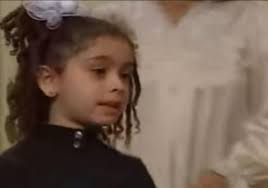

In [35]:
def collate_fn(x):
    return x[0]
#Construct a DataLoader object with the previously created dataset
loader = DataLoader(dataset,collate_fn=collate_fn)

print(loader.dataset)

img, _ = iter(loader).__next__()
img

In [36]:
#Use mtcnn0 to detect the face and probability.

face, prob = mtcnn0(img, return_prob=True)

print(type(face))
print(f"Probability of detected face: {prob}")

<class 'torch.Tensor'>
Probability of detected face: 0.9999992847442627


In [37]:
#Running the Inception-ResNet V1 model
try:
    resnet(face)
except ValueError as e:
    print(e)

print(face.shape)


expected 4D input (got 3D input)
torch.Size([3, 240, 240])


In [38]:
#Change the shape of the tensor from [3, 240, 240] to [1, 3, 240, 240].
face_4d = face.unsqueeze(0)

print(face_4d.shape)
embedding = resnet(face_4d)

print(f"Shape of face embedding: {embedding.shape}")

torch.Size([1, 3, 240, 240])
Shape of face embedding: torch.Size([1, 512])


In [39]:
#Filter out results in which face is None or where the probability is less than 0.90.
# Dictionary that maps name to list of their embeddings
name_to_embeddings = {name: [] for name in idx_to_class.values()}

for img, idx in loader:
    face, prob = mtcnn0(img, return_prob=True)
    if face is not None and prob >=0.9:
        emb = resnet(face.unsqueeze(0))
        name_to_embeddings[idx_to_class[idx]].append(emb)

print(name_to_embeddings.keys())
print(type(name_to_embeddings["azz"]))

dict_keys(['Hoda', 'azz', 'gehad', 'sharf', 'wanis'])
<class 'list'>


In [ ]:
#Take the list of embeddings for both Mary and Ranveer and convert each list to a 2D PyTorch tensor by using torch.stack

In [40]:
embeddings_Hoda = torch.stack(name_to_embeddings["Hoda"])
embeddings_Hoda_shape = embeddings_Hoda.shape
print(f"Shape of stack of embeddings for Hoda: {embeddings_Hoda_shape}")

embeddings_azz = torch.stack(name_to_embeddings["azz"])
embeddings_azz_shape = embeddings_azz.shape
print(f"Shape of stack of embeddings for azz: {embeddings_azz_shape}")

embeddings_gehad = torch.stack(name_to_embeddings["gehad"])
embeddings_gehad_shape = embeddings_gehad.shape
print(f"Shape of stack of embeddings for gehad: {embeddings_gehad_shape}")

embeddings_sharf = torch.stack(name_to_embeddings["sharf"])
embeddings_sharf_shape = embeddings_sharf.shape
print(f"Shape of stack of embeddings for sharf: {embeddings_sharf_shape}")

embeddings_wanis = torch.stack(name_to_embeddings["wanis"])
embeddings_wanis_shape = embeddings_wanis.shape
print(f"Shape of stack of embeddings for wanis: {embeddings_wanis_shape}")


Shape of stack of embeddings for Hoda: torch.Size([7, 1, 512])
Shape of stack of embeddings for azz: torch.Size([7, 1, 512])
Shape of stack of embeddings for gehad: torch.Size([8, 1, 512])
Shape of stack of embeddings for sharf: torch.Size([6, 1, 512])
Shape of stack of embeddings for wanis: torch.Size([7, 1, 512])


In [41]:
#Calculate the average of the stacked embeddings along the zero dimension.
avg_embedding_Hoda = torch.mean(embeddings_Hoda ,dim=0)
print(f"Shape of avg_embedding: {avg_embedding_Hoda.shape}")

avg_embedding_azz = torch.mean(embeddings_azz,dim=0)
print(f"Shape of avg_embedding: {avg_embedding_azz.shape}")

avg_embedding_gehad = torch.mean(embeddings_gehad,dim=0)
print(f"Shape of avg_embedding: {avg_embedding_gehad.shape}")

avg_embedding_sharf = torch.mean(embeddings_sharf,dim=0)
print(f"Shape of avg_embedding: {avg_embedding_sharf.shape}")

avg_embedding_wanis = torch.mean(embeddings_wanis,dim=0)
print(f"Shape of avg_embedding: {avg_embedding_wanis.shape}")

Shape of avg_embedding: torch.Size([1, 512])
Shape of avg_embedding: torch.Size([1, 512])
Shape of avg_embedding: torch.Size([1, 512])
Shape of avg_embedding: torch.Size([1, 512])
Shape of avg_embedding: torch.Size([1, 512])


In [42]:
#Create the list to save the embedding.

embeddings_to_save = [
    (avg_embedding_Hoda, "Hoda"),
    (avg_embedding_azz , "Azz"),
        (avg_embedding_gehad, "Gehad"),
    (avg_embedding_sharf, "Sharf"),
        (avg_embedding_wanis, "Wanis"),

]

torch.save(embeddings_to_save, "embeddings.pt")

In [43]:
#Load the face embeddings.
embedding_data = torch.load("embeddings.pt")

names = [name for _, name in embedding_data]
print(f"Loaded the embedding for: {names}")

mtcnn = MTCNN(image_size=240, keep_all=True, min_face_size=40)
print(f"MTCNN image size: {mtcnn.image_size}")
print(f"MTCNN keeping all faces: {mtcnn.keep_all}")

Loaded the embedding for: ['Hoda', 'Azz', 'Gehad', 'Sharf', 'Wanis']
MTCNN image size: 240
MTCNN keeping all faces: True


In [44]:

mtcnn = MTCNN(image_size=240, keep_all=True, min_face_size=30)
print(f"MTCNN image size: {mtcnn.image_size}")
print(f"MTCNN keeping all faces: {mtcnn.keep_all}")

MTCNN image size: 240
MTCNN keeping all faces: True


In [45]:
#Use torch.dist to calculate the distance between emb and known_emb.
distances = {}

for known_emb, name in embedding_data:
    dist = torch.dist(emb, known_emb).item()
    distances[name] = dist

closest, min_dist = min(distances.items(), key=lambda x: x[1])
print(f"Closest match: {closest}")
print(f"Calculated distance: {min_dist :.2f}")

Closest match: Wanis
Calculated distance: 0.64


In [46]:
#Display the chosen image project4/data/extracted_frames/frame_210.jpg using Image.open.
def recognize_faces(img_path, embedding_data, mtcnn, resnet, threshold=0.7):
    # Generating the bounding boxes, faces tensors, and probabilities
    image = Image.open(img_path)
    boxes, probs = mtcnn.detect(image)
    cropped_images = mtcnn(image)

    if boxes is None:
        return

    # This sets the image size and draws the original image
    width, height = image.size
    dpi = 96
    fig = plt.figure(figsize=(width / dpi, height / dpi), dpi=dpi)
    axis = fig.subplots()
    axis.imshow(image)
    plt.axis("off")

    # Iterating over each face and comparing it against the pre-calculated embeddings
    # from our "database"
    for box, prob, face in zip(boxes, probs, cropped_images):
        if prob < 0.90:
            continue

        # Draw bounding boxes for all detected faces
        rect = plt.Rectangle(
            (box[0], box[1]),
            box[2] - box[0],
            box[3] - box[1],
            fill=False,
            color="blue",
        )
        axis.add_patch(rect)

        # Find the closest face from our database of faces
        emb = resnet(face.unsqueeze(0))
        distances = {}
        for known_emb, name in embedding_data:
            dist = torch.dist(emb, known_emb).item()
            distances[name] = dist

        closest, min_dist = min(distances.items(), key=lambda x: x[1])

        # Drawing the box with recognition results
        name = closest if min_dist < threshold else "Unrecognized"
        color = "red" if name == "Unrecognized" else "blue"
        label = f"{name} {min_dist:.2f}"

        axis.text(box[0], box[1], label, fontsize=8, color=color)

    plt.axis("off")
    plt.show()

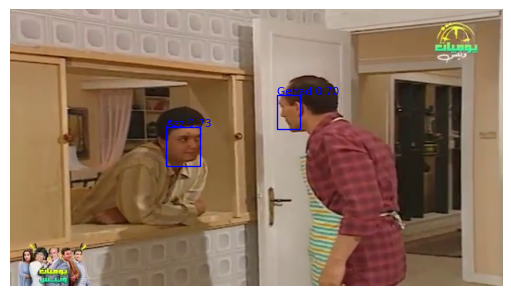

In [47]:
#Run recognize_faces but use a higher threshold of 0.9.
recognize_faces("/content/drive/MyDrive/my_project/data/images/extracted_frames/frame_1015.jpg", embedding_data, mtcnn, resnet, threshold=0.9)

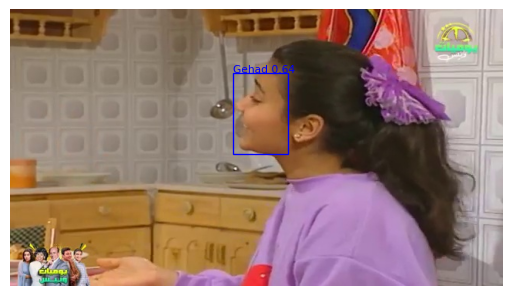

In [48]:
recognize_faces("/content/drive/MyDrive/my_project/data/images/extracted_frames/frame_1040.jpg", embedding_data, mtcnn, resnet, threshold=0.9)

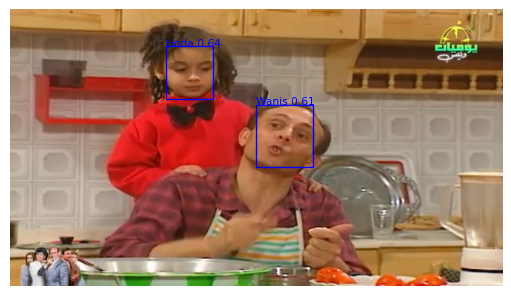

In [49]:
recognize_faces("/content/drive/MyDrive/my_project/data/images/extracted_frames/frame_115.jpg", embedding_data, mtcnn, resnet, threshold=0.9)